# Kaldor's stylized facts and Convergence in Solow

In diesem Notebook wird kurz auf die stylisierten Kaldor-Fakten und die Konvergenztheorie des Solow-Modells eingengangen.
Der empirische Teil und der dazugehörige Code sind nicht relevant für die Übung, aber wir haben es uns am Lehrstuhl zum Ziel erklärt, Ihnen möglichst vielfältige Einblicke in die Makroökonomik, Forschung und Methoden zu bieten.

## Open Source
Um den Zugang zur Forschung und die Replizierbarkeit der eigenen Arbeit zu gewährleisten, greifen Wissenschaftler vermehrt auf Open Source zurück. So finden zum Beispiel Python, Julia, Octave, GitHub und Jupyter immer häufiger Verwendung.
Paul Romer hebt die Vorteile dieser Entwicklung in einem Blogbeitrag (<a href="https://paulromer.net/jupyter-mathematica-and-the-future-of-the-research-paper/">Link</a>) hervor. \
Für das vorliegende Jupyter Notebook habe ich __Markdown__ für die Textbausteine verwendet. Auch __LaTeX__ und __html__ kann verwendet werden. \
Der Code ist in __Python__ geschrieben.
Auch wenn der Code kompliziert und aufwendig aussieht, hat er gegenüber Excel mehrere entscheidende Vorteile:
- das Vorgehen ist transparent dargestellt,
- gegeben, dass der gleiche Datensatz verwendet wird, sind die Ergebnisse replizierbar,
- durch die Verwendung eines aktualisierten Datensatzes kann die Analyse einfach erweitert werden,
- ein umfangreiches Angebot an Analysemethoden und Darstellungsmöglichkeiten stellt Excel schlichtweg in den Schatten.


Python ist kein Muss. Es geht an dieser Stelle lediglich darum, Ihnen aufzuzeigen, wie wissenschaftliches Arbeiten oder Lehre auch aussehen kann.

P.S.: "Progammieren" und "Coden" sind Synonyme für "Copy&Paste aus Stack Overflow". Mit der Zeit wird man um Erfahrungen reicher - oder baut eine Sammlung an Code-Snippets für jeden Zweck und jedes Problem auf.

<a id=0></a>
## Inhaltsübersicht

- [Datenbeschaffung und -aufbereitung (Beispiel)](#1)
- [Kaldor's stylized facts](#2)
    - [Check fact 1](#3)
    - [Check fact 2](#4)
    - [Check fact 3](#5)
    - [Check fact 4](#6)
    - [Check fact 5](#7)
    - [Check fact 6](#8)
    <br><br>
    
- [Konvergenz laut Solow](#9)


<a id='1'></a>
# [Datenbeschaffung und -aufbereitung](#0)

Zunächst werden die Daten beschafft und eine Tabelle erstellt.
Diese wird später für die Erstellung von Plots benötigt.

In [11]:
## Install the package "world_bank_data"
#pip install world_bank_data --upgrade

## Import the packages needed for the analysis 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy.polynomial.polynomial import polyfit
import scipy as sp
import world_bank_data as wb
pd.set_option('display.max_rows', 300)

In [20]:
# Get topics available
wb.get_topics()

,value,sourceNote
id,,
1,Agriculture & Rural Development,For the 70 percent of the world's poor who liv...
2,Aid Effectiveness,Aid effectiveness is the impact that aid has i...
3,Economy & Growth,Economic growth is central to economic develop...
4,Education,Education is one of the most powerful instrume...
5,Energy & Mining,The world economy needs ever-increasing amount...
6,Environment,Natural and man-made environmental resources –...
7,Financial Sector,An economy's financial markets are critical to...
8,Health,Improving health is central to the Millennium ...
9,Infrastructure,Infrastructure helps determine the success of ...


In [21]:
# Get sources available
wb.get_sources()

,lastupdated,name,code,description,url,dataavailability,metadataavailability,concepts
id,,,,,,,,
1,2021-08-18,Doing Business,DBS,,,Y,Y,3
2,2023-05-10,World Development Indicators,WDI,,,Y,Y,3
3,2022-09-23,Worldwide Governance Indicators,WGI,,,Y,Y,3
5,2016-03-21,Subnational Malnutrition Database,SNM,,,Y,Y,3
6,2022-12-06,International Debt Statistics,IDS,,,Y,Y,4
11,2013-02-22,Africa Development Indicators,ADI,,,Y,Y,3
12,2020-12-20,Education Statistics,EDS,,,Y,Y,3
13,2022-03-25,Enterprise Surveys,ESY,,,Y,Y,3
14,2023-05-12,Gender Statistics,GDS,,,Y,Y,3


In [2]:
# Get countries available
wb.get_countries()

,iso2Code,name,region,adminregion,incomeLevel,lendingType,capitalCity,longitude,latitude
id,,,,,,,,,
ABW,AW,Aruba,Latin America & Caribbean,,High income,Not classified,Oranjestad,-70.0167,12.5167
AFE,ZH,Africa Eastern and Southern,Aggregates,,Aggregates,Aggregates,,NaN,NaN
AFG,AF,Afghanistan,South Asia,South Asia,Low income,IDA,Kabul,69.1761,34.5228
...,...,...,...,...,...,...,...,...,...
ZAF,ZA,South Africa,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Upper middle income,IBRD,Pretoria,28.1871,-25.7460
ZMB,ZM,Zambia,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Low income,IDA,Lusaka,28.2937,-15.3982
ZWE,ZW,Zimbabwe,Sub-Saharan Africa,Sub-Saharan Africa (excluding high income),Lower middle income,Blend,Harare,31.0672,-17.8312


In [5]:
# Get income levels
wb.get_incomelevels()

,iso2code,value
id,,
HIC,XD,High income
INX,XY,Not classified
LIC,XM,Low income
...,...,...
LMY,XO,Low & middle income
MIC,XP,Middle income
UMC,XT,Upper middle income


In [7]:
# Get lendig types
wb.get_lendingtypes()

,iso2code,value
id,,
IBD,XF,IBRD
IDB,XH,Blend
IDX,XI,IDA
LNX,XX,Not classified


In [31]:
# Get list of all available variables in the WDI 
# database 
wb.get_indicators(topic=3, source=2)

,name,unit,source,sourceNote,sourceOrganization,topics
id,,,,,,
BG.GSR.NFSV.GD.ZS,Trade in services (% of GDP),,World Development Indicators,Trade in services is the sum of service export...,"International Monetary Fund, Balance of Paymen...","Economy & Growth,Private Sector,Trade"
BM.GSR.CMCP.ZS,"Communications, computer, etc. (% of service i...",,World Development Indicators,"Communications, computer, information, and oth...","International Monetary Fund, Balance of Paymen...","Economy & Growth,Trade"
BM.GSR.FCTY.CD,"Primary income payments (BoP, current US$)",,World Development Indicators,Primary income payments refer to employee comp...,"International Monetary Fund, Balance of Paymen...",Economy & Growth
BM.GSR.GNFS.CD,"Imports of goods and services (BoP, current US$)",,World Development Indicators,Imports of goods and services comprise all tra...,"International Monetary Fund, Balance of Paymen...","Economy & Growth,Trade"
BM.GSR.INSF.ZS,Insurance and financial services (% of service...,,World Development Indicators,Insurance and financial services cover various...,"International Monetary Fund, Balance of Paymen...","Economy & Growth,Private Sector,Trade"
BM.GSR.MRCH.CD,"Goods imports (BoP, current US$)",,World Development Indicators,Goods imports refer to all movable goods (incl...,"International Monetary Fund, Balance of Paymen...","Economy & Growth,Trade"
BM.GSR.NFSV.CD,"Service imports (BoP, current US$)",,World Development Indicators,Services refer to economic output of intangibl...,"International Monetary Fund, Balance of Paymen...","Economy & Growth,Trade"
BM.GSR.ROYL.CD,"Charges for the use of intellectual property, ...",,World Development Indicators,Charges for the use of intellectual property a...,"International Monetary Fund, Balance of Paymen...","Economy & Growth,Science & Technology"
BM.GSR.TOTL.CD,"Imports of goods, services and primary income ...",,World Development Indicators,"Imports of goods, services and primary income ...","International Monetary Fund, Balance of Paymen...","Economy & Growth,External Debt,Trade"


Das ist eine Vielzahl an Variablen.\
Wir interessierun uns für das BIP pro Kopf.\
Mit dem folgenden Befehl können wir die Liste an verfügbaren  Variablen durchsuchen.

In [32]:
# Search for variable
wb.search_indicators('GDP per capita')

,name,unit,source,sourceNote,sourceOrganization,topics
id,,,,,,
6.0.GDPpc_constant,"GDP per capita, PPP (constant 2011 internation...",,LAC Equity Lab,GDP per capita based on purchasing power parit...,World Development Indicators (World Bank),Economy & Growth
CC.GHG.MEMG.GC,Macro drivers of GHG emissions growth in the p...,,Country Climate and Development Report (CCDR),Data reflects the impact of GDP-per capita (as...,"Climate Watch. 2020. Washington, DC: World Res...",
FB.DPT.INSU.PC.ZS,Deposit insurance coverage (% of GDP per capita),,WDI Database Archives,,,
NV.AGR.PCAP.KD.ZG,Real agricultural GDP per capita growth rate (%),,Africa Development Indicators,The growth rate of real per capita GDP in agri...,World Bank country economists.,
NY.GDP.PCAP.CD,GDP per capita (current US$),,World Development Indicators,GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Economy & Growth
NY.GDP.PCAP.CN,GDP per capita (current LCU),,World Development Indicators,GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Economy & Growth
NY.GDP.PCAP.KD,GDP per capita (constant 2015 US$),,World Development Indicators,GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Economy & Growth
NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),,World Development Indicators,Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",Economy & Growth
NY.GDP.PCAP.KN,GDP per capita (constant LCU),,World Development Indicators,GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Economy & Growth


Unsere gesuchte Variable hat die ID

__NY.GDP.PCAP.KD__

Jetzt können wir die gesuchte Zeitreihe aus der Datenbank abrufen und in der Tabelle _dta_ abspeichern.

In [2]:
# retrieve timeseries
dta = wb.get_series('NY.GDP.PCAP.KD', date='1950:2022', id_or_value=('id'))
# create DataFrame
dta = pd.DataFrame([dta]).T
# transform row names into columns
dta.index.name = 'newhead'
dta.reset_index(inplace=True)
#print(dta.head(20))

In [3]:
# retrieve more information on countries
countries = wb.get_countries()
# transform row names into columns
countries.index.name = 'id'
countries.reset_index(inplace=True)

In [4]:
# perform a left join of countries on dta
dta=dta.merge(countries, left_on='Country', right_on='id')
# replace column name of GDP per capita variable
dta.rename(columns={'NY.GDP.PCAP.KD': 'gdp_pc'}, inplace=True)
#print(dta)

In [6]:
# sort data by country and year
dta.sort_values(['Country', 'Year'], inplace = True)
# calculate percentage change of GDP per capita from year to year
dta['gdpc_growth'] = dta.groupby(['Country'])['gdp_pc'].pct_change()
# change column 'Year' into numeric
dta[['Year']] = dta[['Year']].apply(pd.to_numeric)

In [7]:
# create dta2 without aggregates and from 1969 on
dta2 = dta[((dta['region']!='Aggregates') & (~dta['gdp_pc'].isnull()) & (dta['Year']>=1969))]\
  [['Country', 'id', 'name', 'Year', 'gdp_pc', 'gdpc_growth', 'region']]

In [8]:
# create column of gdp_pc in 1969 and only keep
# data for countries that have an valid entry for 1969
dta2 = dta2.merge(dta2[dta2['Year']==1969][['Country', 'gdp_pc']], on='Country', how='inner')
dta2.rename(columns={'gdp_pc_y': 'gdp_pc1969', 'gdp_pc_x': 'gdp_pc'}, inplace=True)

In [9]:
# create column with average gdpc_growth between 1969 and 2019
dta2 = dta2.merge(
    dta2[dta2['Year']<=2019].groupby("Country", as_index=False).gdpc_growth.mean(),
    on='Country', how='left'
)
dta2.rename(columns={'gdpc_growth_x': 'gdpc_growth', 'gdpc_growth_y': 'avg_gdpc_growth'}, inplace=True)

<a id='2'></a>
# [Kaldor's stylized facts](#0)

Stylisierte Fakten daher, da die Beobachtungen Kaldors (1957, <a href="https://www.jstor.org/stable/2227704">Link</a> zum Paper) ursprünglich lediglich auf Daten zu den USA und Großbritannien beruhten, aber leicht abgeändert tatsächlich auf viele Länder zutreffen.

Wir gehen von der folgenden Cobb-Douglas-Produktionsfunktion mit labor-augmented technology aus:

$$F(K, L\times E) = K^\alpha(L\times E)^{1-\alpha}$$

### 1. Produktion pro Kopf wächst mit einer konstanten Rate, die über die Zeit nicht abnimmt

$$\frac{y_{t+1}E_{t+1}-y_{t}E_{t}}{y_{t}E_{t}} = g$$

### 2. Kapital pro Kopf wächst über die Zeit

$$\frac{K_{t+1}L_{t+1}^{-1}-K_{t}L_{t}^{-1}}{K_{t}L_{t}^{-1}} = \frac{K_{t+1}L_{t+1}^{-1}\frac{L_{t+1}\times E_{t+1}}{L_{t+1}\times E_{t+1}}-K_{t}L_{t}^{-1}\frac{L_{t}\times E_{t}}{L_{t}\times E_{t}}}{K_{t}L_{t}^{-1}\frac{L_{t}\times E_{t}}{L_{t}\times E_{t}}}$$
$$=\frac{k_{t+1}L_{t+1}^{-1}(L_{t+1}\times E_{t+1})-k_{t} L_{t}^{-1}(L_t\times E_t)}{k_{t} L_{t}^{-1}(L_t\times E_t)}$$

$$=\frac{(1+g_k)k_{t}((1+n)L_{t})^{-1}(1+n)L_{t}\times (1+g)E_{t}-k_{t} L_{t}^{-1}(L_t\times E_t)}{k_{t} L_{t}^{-1}(L_t\times E_t)} =g$$

### 3. Das Kapital-Produktions-Verhältnis bleibt konstant über die Zeit

$$\frac{K_t}{Y_t}=\frac{K_t}{K_t^\alpha(L_t\times E_t)^{1-\alpha}}=\left(\frac{K_t}{L_t\times E}\right)^{1-\alpha}=k_t^{1-\alpha}$$
$$\Rightarrow \frac{k_{t+1}^{1-\alpha}-k_t^{1-\alpha}}{k_t^{1-\alpha}} = \frac{((1+g_k)k_{t})^{1-\alpha}-k_t^{1-\alpha}}{k_t^{1-\alpha}}=0$$


### 4. Die Verzinsung des Kapitals ist nahezu konstant über die Zeit

$$MPK_t = \frac{\partial Y}{\partial K}= \alpha K^{\alpha - 1}(L\times E)^{1-\alpha}=\alpha k^{\alpha - 1}$$
$$g_{_{MPK}}=\frac{\alpha k_{t+1}^{\alpha-1}-\alpha k_{t}^{\alpha-1}}{\alpha k_{t}^{\alpha-1}}=\frac{\alpha ((1+g_k)k_{t})^{\alpha-1}-\alpha k_{t}^{\alpha-1}}{\alpha k_{t}^{\alpha-1}}=0$$

Im ausgewogenen Wachstumspfad ist der Realzins (= MPK) konstant.

### 5. Der Reallohn wächst über die Zeit
$$MPL_t= \frac{\partial Y_t}{\partial L_t}= (1-\alpha) K_t^{\alpha}(L_t\times E_t)^{-\alpha}E_t=(1-\alpha) k_t^{\alpha}E_t$$
$$\text{Wachstum}_\text{MPL}= \frac{(1-\alpha) k_{t+1}^\alpha E_{t+1}-(1-\alpha) k_{t}^\alpha E_{t}}{(1-\alpha) k_{t}^\alpha E_{t}}=\frac{(1-\alpha) ((1+g_k)k_{t})^\alpha (1+g)E_{t}-(1-\alpha) k_{t}^\alpha E_{t}}{(1-\alpha) k_{t}^\alpha E_{t}}=g$$

Im ausgewogenen Wachstumspfad wächst der Reallohn mit der Rate g.

### 6. Die Einkommensverteilung zwischen Arbeit und Kapitals ist konstant über die Zeit

#### Kapitaleinkommensquote:
Variante 1:

$$\frac{R \cdot K}{P \cdot Y} = \frac{R}{P} \cdot \frac{K}{Y}=MPK\cdot \frac{Y}{K}=MPK \cdot \left(\frac{K}{Y}\right)^{-1}$$ \
$$ \Rightarrow g_{_{\frac{K}{Y}}}=0, \qquad g_{_{MPK}} = 0 \qquad \Rightarrow g_{_{MPK\cdot \frac{Y}{K}}} = \frac{\frac{(1+0)MPK}{(1+0)\frac{K}{Y}}-\frac{MPK}{\frac{K}{Y}}}{\frac{MPK}{\frac{K}{Y}}} = 0$$

Variante 2:
$$\frac{R \cdot K}{P \cdot Y} = \frac{R}{P} \cdot \frac{K}{Y}=MPK\cdot \frac{K}{Y}$$ 

$$ MPK=\frac{\partial Y}{\partial K} \leftrightarrow \underbrace{\alpha \frac{Y}{K}}_{MPK} \cdot \frac{K}{Y} = \alpha$$


Im ausgewogenen Wachstumspfad ist die Kapitaleinkommensquote konstant.

#### Lohneinkommensquote:
Variante 1:

$$\frac{W \cdot L}{P \cdot Y} = \frac{W}{P}\frac{L}{Y}=MPL\cdot \frac{L}{Y} = MPL \cdot \left(\frac{Y}{L}\right)^{-1}=\frac{MPL}{\frac{Y}{L}}$$ \
$$ \Rightarrow g_{_{\frac{Y}{L}}}=\frac{K_{t+1}^\alpha(L_{t+1}\times E_{t+1})^{1-\alpha}L_{t+1}^{-1}-K_{t}^\alpha(L_{t}\times E_{t})^{1-\alpha}L_{t}^{-1}}{K_{t}^\alpha(L_{t}\times E_{t})^{1-\alpha}L_{t}^{-1}}=\frac{k_{t+1}^\alpha L_{t+1}\times E_{t+1}L_{t+1}^{-1}-k_{t}^\alpha L_{t}\times E_{t}L_{t}^{-1}}{k_{t}^\alpha L_{t}\times E_{t} L_{t}^{-1}}=\frac{((1+g_k)k_{t})^\alpha (1+g)E_{t+1}-k_{t}^\alpha E_{t}}{k_{t}^\alpha E_{t}}=g$$ \
$$g_{_{MPL}} = g$$

$$\Leftrightarrow g_{_{\frac{MPL}{\frac{Y}{L}}}}=\frac{g}{g}=1$$

Variante 2:
$$\frac{W \cdot L}{P \cdot Y} = \frac{W}{P}\frac{L}{Y}= MPL \cdot \frac{L}{Y}$$

$$MPL = \frac{\partial Y}{\partial L} \leftrightarrow \underbrace{(1-\alpha) \frac{Y}{L}}_{MPL} \cdot \frac{L}{Y}=(1-\alpha)$$
Im ausgewogenen Wachstumspfad ist die Lohneinkommensquote konstant.


Wachstumsraten im ausgewogenen Wachstumspfad von $F(K,L\times E)=K^\alpha (L\times E)^{1-\alpha}$:

- __abolut__: n+g
- __je Arbeitnehmer__: g
- __je Effizienzeinheit__: 0

<a id=3></a>
## [Checking Kaldor's fact 1](#0)

Wir wollen das Wachstum des BIP pro Kopf (in 2015 US$) zwischen 1969 und 2019 für so viele Länder wie möglich betrachten. \
Wir verwenden hierfür den Logarithmus des BIP pro Kopf und plotten die Zeitreihe für den gesamten Zeitraum. \
Gesetzt Output pro Kopf wächst mit einer konstanten Rate, welches Bild würden Sie erwarten? \
Trifft diese These zu? Trifft sie auf alle Länder zu?

In [10]:
# determine how many countries we have
len(set(dta2.name))

102

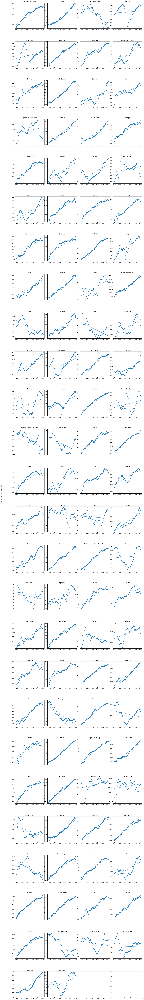

In [10]:
# plot gdp_pc growth for all 102 countries in dta2
fig, axs = plt.subplots(26,4, figsize=(20, 26*6), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.text(0.04, 0.5, 'log GDP per capita (2015 US$)', va='center', rotation='vertical')

axs = axs.ravel()

for i in range(len(set(dta2.name))):
    tmp = dta2[dta2.name==list(set(dta2.name))[i]]
    axs[i].scatter(tmp.Year, np.log(tmp.gdp_pc), linestyle='')
    axs[i].plot(np.unique(tmp.Year), np.poly1d(np.polyfit(tmp.Year, np.log(tmp.gdp_pc), 1))(np.unique(tmp.Year)))
    axs[i].set_title(list(set(dta2.name))[i])

Wir schließen die Regionen _Latin America & Caribbean_ und _Sub-Saharan Africa_ aus.

## [Checking facts 2 & 3](#0)

Für den Kapitalstock laden wir Daten des inernationalen Währungsfonds (IMF) in unser Notebook.
Folgende Variablen sind im Datensatz enthalten:

__igov_rppp__: General government investment (gross fixed capital formation), in billions of constant 2017 international dollars.
	
__kgov_rppp__: General government capital stock (constructed based on general government investment flows "igov_rppp"), in billions of constant 2017 international dollars.
	
__ipriv_rppp__: Private investment (gross fixed capital formation), in billions of constant 2017 international dollars.
	
__kpriv_rppp__: Private capital stock (constructed based on private investment flows "igov_rppp"), in billions of constant 2017 international dollars.
	
__ippp_rppp__: Public-private partnership (PPP) investment, in billions of constant 2017 international dollars.
	
__kppp_rppp__: Public-private partnership (PPP) capital stock (constructed based on PPP investment flows "ippp_rppp"), in billions of constant 2017 international dollars.
	
__GDP_rppp__: Gross domestic product, in billions of constant 2017 international dollars.
	
__igov_n__: General government investment (gross fixed capital formation), in billions of nominal national currency
	
__kgov_n__: General government capital stock, in billions of nominal national currency
	
__ipriv_n__: Private investment (gross fixed capital formation), in billions of nominal national currency
	
__kpriv_n__: Private capital stock, in billions of nominal national currency

Die Variablen __k*rppp__, die Informationen zum Kapitalstock auf staatlicher und privater Ebene enthalten gemessen in internationalen US-Dollar (2017), scheinen recht inreressant zu sein.

In [11]:
k_url = "https://infrastructuregovern.imf.org/content/dam/PIMA/Knowledge-Hub/dataset/IMFInvestmentandCapitalStockDataset2021.xlsx"
k_dta = pd.read_excel(k_url, sheet_name="Dataset")

In [12]:
k_dta

,isocode,ifscode,country,year,igov_rppp,kgov_rppp,ipriv_rppp,kpriv_rppp,ippp_rppp,kppp_rppp,GDP_rppp,igov_n,kgov_n,ipriv_n,kpriv_n,kppp_n,GDP_n,income
0,AFG,512,Afghanistan,1960,3.305186,50.134384,1.253210,14.863815,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low Income Developing Countries
1,AFG,512,Afghanistan,1961,3.437393,52.144897,1.303339,15.458683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low Income Developing Countries
2,AFG,512,Afghanistan,1962,3.574889,54.235703,1.355472,16.077332,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low Income Developing Countries
3,AFG,512,Afghanistan,1963,3.717885,56.410011,1.409691,16.720713,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low Income Developing Countries
4,AFG,512,Afghanistan,1964,3.866600,58.671173,1.466079,17.389818,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Low Income Developing Countries
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11635,ZWE,698,Zimbabwe,2015,NaN,NaN,NaN,NaN,0.014446,0.279580,41.999676,NaN,NaN,NaN,NaN,0.187727,19.963121,Low Income Developing Countries
11636,ZWE,698,Zimbabwe,2016,NaN,NaN,NaN,NaN,0.000000,0.286856,42.317142,NaN,NaN,NaN,NaN,0.193582,20.548677,Low Income Developing Countries
11637,ZWE,698,Zimbabwe,2017,NaN,NaN,NaN,NaN,0.019201,0.279685,44.307755,NaN,NaN,NaN,NaN,0.191396,22.040903,Low Income Developing Countries
11638,ZWE,698,Zimbabwe,2018,NaN,NaN,NaN,NaN,0.018904,0.291654,46.447678,NaN,NaN,NaN,NaN,0.202726,24.311560,Low Income Developing Countries


Hilfreich wäre eine Variable, die den ganzen Kapitalstock zusammenfässt - sprich also die Summe des realen Kapitalstocks.

In [74]:
k_dta["capital"]=(k_dta.kgov_rppp + k_dta.kpriv_rppp + k_dta.kppp_rppp) * (10**9)
# variables are denoted in billions of international dollar

In [75]:
# delete missing values
k_dta = k_dta[~(k_dta.capital.isnull())]

In [76]:
print('period from %s till %s' % (min(k_dta.year), max(k_dta.year)))

period from 1985 till 2019


Wir haben erst vollständige Daten für Jahre ab 1985.

Für eine Berechung der Kapitalintensität pro Kopf fehlt uns noch die Bevölkerung. Hier greifen wir wieder auf die Weltbank zurück.

In [45]:
wb.search_indicators('Population, total')

,name,unit,source,sourceNote,sourceOrganization,topics
id,,,,,,
JI.POP.URBN.ZS,"Urban population, total (% of total population)",,Global Jobs Indicators Database (JOIN),,,
SP.POP.AG00.TO.UN,"Population, age 0, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education
SP.POP.AG01.TO.UN,"Population, age 1, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education
SP.POP.AG02.TO.UN,"Population, age 2, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education
SP.POP.AG03.TO.UN,"Population, age 3, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education
SP.POP.AG04.TO.UN,"Population, age 4, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education
SP.POP.AG05.TO.UN,"Population, age 5, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education
SP.POP.AG06.TO.UN,"Population, age 6, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education
SP.POP.AG07.TO.UN,"Population, age 7, total",,Education Statistics,"Age population, total refers to total populati...",UNESCO Institute for Statistics.,Education


__SP.POP.TOTL__ gibt die Bevölkerungsgrößer einer Nation wieder.

In [21]:
# retrieve timeseries
pop = wb.get_series('SP.POP.TOTL', date='1985:2019', id_or_value=('id'))
# create DataFrame
pop = pd.DataFrame([pop]).T
# transform row names into columns
pop.index.name = 'newhead'
pop.reset_index(inplace=True)
# perform a left join of countries on dta
pop = pop.merge(countries, left_on='Country', right_on='id')
# reduce table size & replace column name of population variable
pop = pop[['Country', 'Year', 'SP.POP.TOTL', 'region', 'name']]
pop.rename(columns={'SP.POP.TOTL': 'population'}, inplace=True)
# remove aggregates and missing values
pop = pop[((pop['region']!='Aggregates') & (~pop['population'].isnull()))]

# sort data by country and year
pop.sort_values(['Country', 'Year'], inplace = True)
# change column 'Year' into numeric
pop[['Year']] = pop[['Year']].apply(pd.to_numeric)


In [22]:
missing_key = []
valid_key = []
for i in set(k_dta.country):
    if i not in set(pop.name):
        missing_key.append(i)
    else:
        valid_key.append(i)
        
if len(missing_key)>0:
    print('%s countries cannot be matched with the population table.'% (len(missing_key)))
    print('Those countries are:')
    for i in missing_key:
        print(i)

14 countries cannot be matched with the population table.
Those countries are:
Egypt
Côte d'Ivoire
Congo, Democratic Republic of the
Syria
Yemen
São Tomé and Príncipe
Iran
Venezuela
Congo, Republic of
Lao P.D.R.
Montenegro, Rep. of
Czech Republic
Turkey
Russia


In [23]:
err_key = pop.merge(k_dta, left_on='name', right_on='country', how='outer')[['name', 'country']].drop_duplicates()
err_key=err_key[((err_key.country.isnull())|(err_key.name.isnull()))]

In [24]:
set(err_key.country)

{'Congo, Democratic Republic of the',
 'Congo, Republic of',
 'Czech Republic',
 "Côte d'Ivoire",
 'Egypt',
 'Iran',
 'Lao P.D.R.',
 'Montenegro, Rep. of',
 'Russia',
 'Syria',
 'São Tomé and Príncipe',
 'Turkey',
 'Venezuela',
 'Yemen',
 nan}

In [25]:
set(err_key.name)

{'Afghanistan',
 'American Samoa',
 'Andorra',
 'Antigua and Barbuda',
 'Aruba',
 'Australia',
 'Bahamas, The',
 'Bahrain',
 'Barbados',
 'Bermuda',
 'British Virgin Islands',
 'Brunei Darussalam',
 'Burundi',
 'Canada',
 'Cayman Islands',
 'Channel Islands',
 'Chile',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 "Cote d'Ivoire",
 'Cuba',
 'Curacao',
 'Czechia',
 'Dominica',
 'Egypt, Arab Rep.',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Eswatini',
 'Faroe Islands',
 'French Polynesia',
 'Gibraltar',
 'Greenland',
 'Grenada',
 'Guam',
 'Hong Kong SAR, China',
 'Iceland',
 'Iran, Islamic Rep.',
 'Isle of Man',
 'Jamaica',
 'Japan',
 'Kiribati',
 "Korea, Dem. People's Rep.",
 'Korea, Rep.',
 'Kosovo',
 'Kuwait',
 'Kyrgyz Republic',
 'Lao PDR',
 'Latvia',
 'Libya',
 'Liechtenstein',
 'Macao SAR, China',
 'Malta',
 'Marshall Islands',
 'Micronesia, Fed. Sts.',
 'Monaco',
 'Montenegro',
 'Nauru',
 'New Caledonia',
 'New Zealand',
 'Northern Mariana Islands',
 'Norway',
 'Oman',
 'Palau',
 'Pa

Wir erstellen ein diciotnary, in dem wir den 14 Ländern aus der k_dta eine Schreibweise aus den Daten der Weltbank zuordnen.
Für alle fehldenen Länder finden wir einen Namen


In [26]:
# k_dta.country : pop.name
name_dict = {
    'Congo, Democratic Republic of the':'Congo, Dem. Rep.',
    'Congo, Republic of':'Congo, Rep.',
    'Czech Republic':'Czechia',
    "Côte d'Ivoire":"Cote d'Ivoire",
    'Egypt':'Egypt, Arab Rep.',
    'Iran':'Iran, Islamic Rep.',
    'Lao P.D.R.':'Lao PDR',
    'Montenegro, Rep. of':'Montenegro',
    'Russia':'Russian Federation',
    'Syria':'Syrian Arab Republic',
    'São Tomé and Príncipe':'Sao Tome and Principe',
    'Turkey':'Turkiye',
    'Venezuela':'Venezuela, RB',
    'Yemen':'Yemen, Rep.',
}

In [27]:
k_dta.country.replace(to_replace = name_dict, inplace=True)

/tmp/ipykernel_5007/1863891498.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  k_dta.country.replace(to_replace = name_dict, inplace=True)


In [28]:
# merge k_dta and pop
k_dta = k_dta.merge(pop, left_on=('country', 'year'), right_on=('name', 'Year'), how='left')
# add capital/capita ratio
k_dta['kpop_ratio'] = k_dta.capital / k_dta.population

<a id=4></a>
### [2. Kapital pro Kopf wächst mit der Zeit](#0)

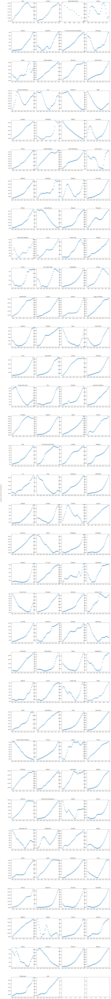

In [78]:
# plot capital/capita ratio for all 102 countries in dta2
fig, axs = plt.subplots(34,4, figsize=(20, 34*6), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.text(0.04, 0.5, 'capital per capita (2017 international $)', va='center', rotation='vertical')

axs = axs.ravel()

for i in range(len(set(k_dta.country))):
    tmp = k_dta[k_dta.country==list(set(k_dta.country))[i]]
    axs[i].scatter(tmp.year, tmp.kpop_ratio, linestyle='')
    axs[i].set_title(list(set(k_dta.country))[i])

<a id=5></a>
### [3. Das Kapital-Produktions-Verhältnis bleibt konstant über die Zeit](#0)

Mit __GDP\_rppp__ gibt es das BIP PPPP inernationaler $ 2017 bereits im Datensatz des IMF. Wir verwenden diese Variable zur Berechnung der Kapital-Output-Ratio.

In [79]:
k_dta['ky_ratio'] = k_dta.capital / k_dta.GDP_rppp

In interationel Dollars von 2017 ausgedrückt ist das Verhältnis nicht konstant.

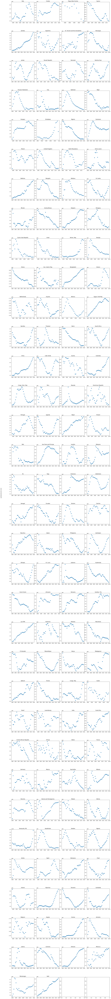

In [80]:
# plot capital/production ratio for all 102 countries in dta2
fig, axs = plt.subplots(34,4, figsize=(20, 34*6), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.text(0.04, 0.5, 'capital/production-ratio', va='center', rotation='vertical')

axs = axs.ravel()

for i in range(len(set(k_dta.country))):
    tmp = k_dta[((k_dta.country==list(set(k_dta.country))[i])&
                 (~k_dta.ky_ratio.isnull())&(k_dta.capital>0))]
    axs[i].scatter(tmp.year, tmp.ky_ratio, linestyle='')
    axs[i].set_title(list(set(k_dta.country))[i])

<a id=6></a>
### [4. Die Verzinsung des Kapitals ist nahezu konstant über die Zeit](#0)

Übersetzt: MPK / der reale Zins ist konstant.

$$r_{real}=i_{nominal}-\pi$$

Die <a href='https://databank.worldbank.org/metadataglossary/world-development-indicators/series/FR.INR.RINR'>Worldbank</a> berechnet den realen Zinssatz folgendermaßen:
>Real interest rate is the lending interest rate adjusted for inflation as measured by the GDP deflator. 

In [47]:
wb.search_indicators('lending interest rate')

,name,unit,source,sourceNote,sourceOrganization,topics
id,,,,,,
FR.INR.DPST.DP,Real deposit interest rate (%),,Africa Development Indicators,Real interest rate is the lending interest rat...,"International Monetary Fund, International Fin...",
FR.INR.LEND,Lending interest rate (%),,World Development Indicators,Lending rate is the bank rate that usually mee...,"International Monetary Fund, International Fin...",Financial Sector
FR.INR.RINR,Real interest rate (%),,World Development Indicators,Real interest rate is the lending interest rat...,"International Monetary Fund, International Fin...",Financial Sector


In [49]:
wb.search_indicators('inflation')

,name,unit,source,sourceNote,sourceOrganization,topics
id,,,,,,
6.0.GNIpc,GNI per capita (2011 $),,LAC Equity Lab,"GNI per capita is the gross national income, c...",LAC Equity Lab Tablulations of the World Devel...,Economy & Growth
CPTOTSAXMZGY,"CPI Price, % y-o-y, median weighted, seas. adj.",,Global Economic Monitor,Median inflation rate calculated for geographi...,World Bank staff calculations based on Datastr...,
FP.CPI.TOTL.ZG,"Inflation, consumer prices (annual %)",,World Development Indicators,Inflation as measured by the consumer price in...,"International Monetary Fund, International Fin...","Economy & Growth,Financial Sector"
FP.FPI.TOTL.ZG,"Inflation, food prices (annual %)",,WDI Database Archives,,,
FP.WPI.TOTL.ZG,"Inflation, wholesale prices (annual %)",,WDI Database Archives,,,
FR.INR.DPST.DP,Real deposit interest rate (%),,Africa Development Indicators,Real interest rate is the lending interest rat...,"International Monetary Fund, International Fin...",
FR.INR.RINR,Real interest rate (%),,World Development Indicators,Real interest rate is the lending interest rat...,"International Monetary Fund, International Fin...",Financial Sector
GCI.3RDPILLAR.XQ,3rd pillar: Macroeconomic stability,,Africa Development Indicators,This indicator is a derived from the following...,The Global Competitiveness Report: various iss...,
MO.INDEX.ECON.XQ,Sustainable Economic Opportunity,,Africa Development Indicators,Public Management: Within this subcategory th...,"Mo Ibrahim Foundation, electronic files and we...",


Interest rate: __FR.INR.LEND__

BIP-Deflator: __NY.GDP.DEFL.KD.ZG__

In [50]:
## Retrieving lending rate

# retrieve timeseries
lend = wb.get_series('FR.INR.LEND', date='1969:2019', id_or_value=('id'))
# create DataFrame
lend = pd.DataFrame([lend]).T
# transform row names into columns
lend.index.name = 'newhead'
lend.reset_index(inplace=True)
# perform a left join of countries on dta
lend = lend.merge(countries, left_on='Country', right_on='id')
# reduce table size & replace column name of interest rate variable
lend = lend[['Country', 'Year', 'FR.INR.LEND', 'region', 'name']]
lend.rename(columns={'FR.INR.LEND': 'lend_rate'}, inplace=True)
# remove aggregates and missing values
lend = lend[((lend['region']!='Aggregates') & (~lend['lend_rate'].isnull()))]

# sort data by country and year
lend.sort_values(['Country', 'Year'], inplace = True)
# change column 'Year' into numeric
lend[['Year']] = lend[['Year']].apply(pd.to_numeric)


In [53]:
## Retrieving GDP deflator

# retrieve timeseries
infl = wb.get_series('NY.GDP.DEFL.KD.ZG', date='1969:2019', id_or_value=('id'))
# create DataFrame
infl = pd.DataFrame([infl]).T
# transform row names into columns
infl.index.name = 'newhead'
infl.reset_index(inplace=True)
# perform a left join of countries on dta
infl = infl.merge(countries, left_on='Country', right_on='id')
# perform a inner join of lend rate on gdp deflator
infl = infl.merge(lend, on=('Country','Year'), how="inner")
# reduce table size & replace column name of interest rate variable
infl = infl[['Country', 'Year', 'NY.GDP.DEFL.KD.ZG', 'region', 'name']]
infl.rename(columns={'NY.GDP.DEFL.KD.ZG': 'gdp_defl'}, inplace=True)
# remove aggregates and missing values
infl = infl[((infl['region']!='Aggregates') & (~infl['gdp_defl'].isnull()))]

# sort data by country and year
infl.sort_values(['Country', 'Year'], inplace = True)
# change column 'Year' into numeric
infl[['Year']] = infl[['Year']].apply(pd.to_numeric)


In [66]:
# calulate real interest rate
infl['rr'] = infl.lend_rate - infl.gdp_defl

In [69]:
len(set(infl.Country))/4

37.0

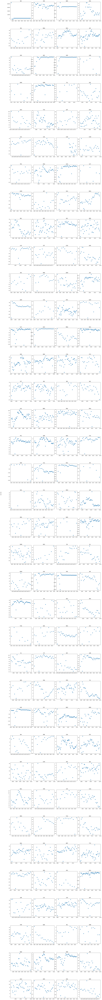

In [73]:
# plot real rate for all countries in infl
fig, axs = plt.subplots(37,http://127.0.0.1:8888/notebooks/Dokumente/Solow%20-%20Konvergenz.ipynb4, figsize=(20, 37*6), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.text(0.04, 0.5, 'real rate', va='center', rotation='vertical')

axs = axs.ravel()

for i in range(len(set(infl.Country))):
    tmp = infl[((infl.Country==list(set(infl.Country))[i])&
                 (~infl.rr.isnull()))]
    axs[i].scatter(tmp.Year, tmp.rr, linestyle='')
    axs[i].set_title(list(set(infl.Country))[i])

<a id=7></a>
### [5. Der Reallohn wächst über die Zeit](#0)

Der Datensatz der ILO ist leider etwas kurz und reicht nur bis 2014 zurück.

In [98]:
w_url = "https://www.ilo.org/ilostat-files/Documents/Excel/INDICATOR/EAR_4HRL_SEX_OCU_CUR_NB_A_EN.xlsx"
w_dta = pd.read_excel(w_url, skiprows=5)

In [102]:
w_dta

,Reference area,Source,Sex,Occupation,Time,Local currency,2017 PPP $,U.S. dollars,Unnamed: 8
0,Afghanistan,HIES - Households Living Conditions Survey,Total,Total,2014,53.37,3.01,0.93,Notes\n\nAverage hourly earnings of employees ...
1,Afghanistan,HIES - Households Living Conditions Survey,Total,1. Managers,2014,101.86,5.74,1.78,Notes\n\nAverage hourly earnings of employees ...
2,Afghanistan,HIES - Households Living Conditions Survey,Total,2. Professionals,2014,85.80,4.83,1.50,Notes\n\nAverage hourly earnings of employees ...
3,Afghanistan,HIES - Households Living Conditions Survey,Total,3. Technicians and associate professionals,2014,85.52,4.82,1.49,Notes\n\nAverage hourly earnings of employees ...
4,Afghanistan,HIES - Households Living Conditions Survey,Total,4. Clerical support workers,2014,80.32,4.52,1.40,Notes\n\nAverage hourly earnings of employees ...
...,...,...,...,...,...,...,...,...,...
16150,Zimbabwe,LFS - Labour Force Survey,Female,"6. Skilled agricultural, forestry and fishery ...",2021,31.94,0.01,NaN,Notes\n\nAverage hourly earnings of employees ...
16151,Zimbabwe,LFS - Labour Force Survey,Female,7. Craft and related trades workers,2021,54.28,0.02,NaN,Notes\n\nAverage hourly earnings of employees ...
16152,Zimbabwe,LFS - Labour Force Survey,Female,"8. Plant and machine operators, and assemblers",2021,126.51,0.05,NaN,Notes\n\nAverage hourly earnings of employees ...
16153,Zimbabwe,LFS - Labour Force Survey,Female,9. Elementary occupations,2021,29.87,0.01,NaN,Notes\n\nAverage hourly earnings of employees ...


In [103]:
w_dta.keys()

Index(['Reference area', 'Source', 'Sex', 'Occupation', 'Time',
       'Local currency', '2017 PPP $', 'U.S. dollars', 'Unnamed: 8'],
      dtype='object')

In [131]:
w_dta = w_dta[((w_dta.Sex=='Total')&(w_dta.Occupation=='Total'))]

In [137]:
len(set(w_dta['Reference area']))/4

28.75

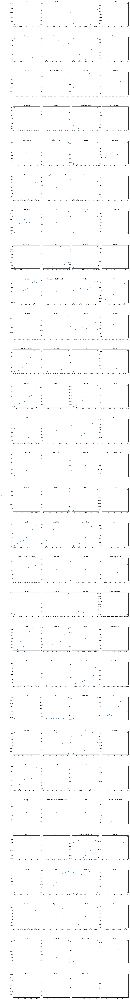

In [138]:
# plot real wage for all countries in w_dta (2014-2021)
fig, axs = plt.subplots(29,4, figsize=(20, 29*6), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.text(0.04, 0.5, '2017 PPP $', va='center', rotation='vertical')

axs = axs.ravel()

for i in range(len(set(w_dta['Reference area']))):
    tmp = w_dta[w_dta['Reference area']==list(set(w_dta['Reference area']))[i]]
    axs[i].scatter(tmp.Time, tmp['2017 PPP $'], linestyle='')
    axs[i].set_title(list(set(w_dta['Reference area']))[i])

<a id=8></id>
### [6. Die Einkommensverteilung zwischen Arbeit und Kapitals ist konstant über die Zeit](#0)

$$\frac{\frac{W \cdot L}{P \cdot Y}}{\frac{R \cdot K}{P \cdot Y}} = \frac{MPL \cdot L}{MPK \cdot K} = \frac{w_{real}\cdot L}{r_{real} \cdot K}$$

Mit _pandaSDMX_ wäre es normalerweise ein Leichtes, die Daten von der OECD in Python zu laden, allerdings kommt es auf meinem PC nur zu Fehlern. 
Daher habe ich Daten zu 'Unit Labor Costs' (Verhältnis von durchschnittlichem Stundenlohn zu durchschnittlichem Ouput je Stunde) als CSV heruntergeladen und in das Notebook geladen.

Quelle: https://data.oecd.org/lprdty/unit-labour-costs.htm
Jährliche Werte für den Zeitraum 1969-2019 und alle verfügbaren Länder.


Wir werfen einen Blick auf die jährliche Änderungsrate des Verhältnisses von Stundenlohn und Output je Stunde.

In [12]:
ucl = pd.read_csv('/home/jmo/Downloads/DP_LIVE_29052023131518814.csv')

In [13]:
ucl.head(10)

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,NOR,ULC,HRWKD,PC_CHGPP,A,1971,9.209471,NaN
1,NOR,ULC,HRWKD,PC_CHGPP,A,1972,5.659604,NaN
2,NOR,ULC,HRWKD,PC_CHGPP,A,1973,7.571038,NaN
3,NOR,ULC,HRWKD,PC_CHGPP,A,1974,10.260190,NaN
4,NOR,ULC,HRWKD,PC_CHGPP,A,1975,12.679820,NaN
5,NOR,ULC,HRWKD,PC_CHGPP,A,1976,9.427893,NaN
6,NOR,ULC,HRWKD,PC_CHGPP,A,1977,8.633568,NaN
7,NOR,ULC,HRWKD,PC_CHGPP,A,1978,5.744105,NaN
8,NOR,ULC,HRWKD,PC_CHGPP,A,1979,-0.200400,NaN
9,NOR,ULC,HRWKD,PC_CHGPP,A,1980,7.155923,NaN


In [20]:
set(ucl.MEASURE)

{'IDX2015', 'PC_CHGPP', 'PC_CHGPY'}

In [16]:
len(set(ucl.LOCATION))/4

12.0

In [33]:
# only keep annual values
ucl = ucl.loc[ucl['TIME'].str.len() == 4]

In [34]:
# change column 'TIME' into numeric
ucl[['TIME']] = ucl[['TIME']].apply(pd.to_numeric)

/tmp/ipykernel_5053/1029499741.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ucl[['TIME']] = ucl[['TIME']].apply(pd.to_numeric)


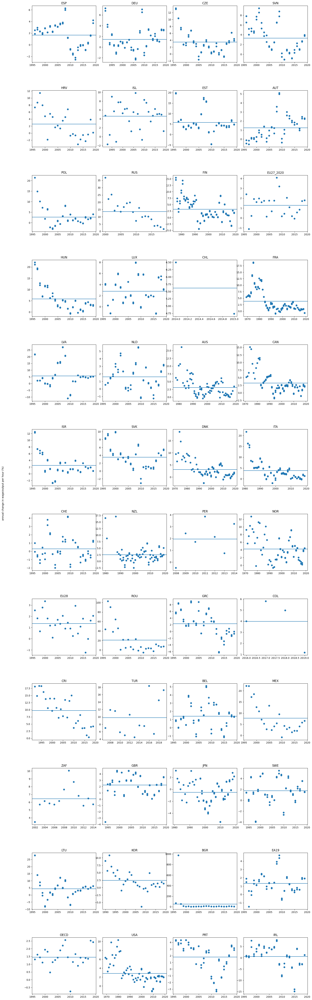

In [37]:
# plot wage/output ratio for all 48 countries in ucl
fig, axs = plt.subplots(12,4, figsize=(20, 12*6), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.text(0.04, 0.5, 'annual change in wage/output per hour (%)', va='center', rotation='vertical')

axs = axs.ravel()

for i in range(len(set(ucl.LOCATION))):
    tmp = ucl[((ucl.LOCATION==list(set(ucl.LOCATION))[i])&(ucl.TIME>=1969)&(ucl.TIME<=2019)&
                 (~ucl.Value.isnull())&(ucl.MEASURE=='PC_CHGPP'))]
    axs[i].scatter(tmp.TIME, tmp.Value, linestyle='')
    axs[i].axhline(y=np.nanmean(tmp.Value))
    axs[i].set_title(list(set(ucl.LOCATION))[i])

Die Hypothese konstanter Lohneinkommensquoten trifft in dieser Überprüfung nur auf wenige Länder zu, denn die für die meisten Länder im Sample ist die Änderungsrate der Quote von Jahr zu Jahr im Durchschnitt verschieden von 0 (horizontale Linie im Plot).

<a id=9></a>
# [Konvergenz laut Solow](#0)


Laut dem Solow-Modell wachsen Volkswirtschaften schneller je weiter weg sie von ihrem Steady State sind.
Gesetzt zwei Volkswirtschaften unterscheiden sich lediglich in ihrer Kapitalintensität, dann konvergieren diese beiden Wirtschaftsräume

### Absolute Konvergenz:
Wir wollen das reale BIP pro Kopf von 1969 und das durchschnittliche Wachstum des BIP pro Kopf zwischen 1969 und 2019 in einem Scatter-Plot darstelln.
Gesetzt dem Fall, die Konvergenz-Theorie trifft zu: Welches Bild würden Sie erwarten?

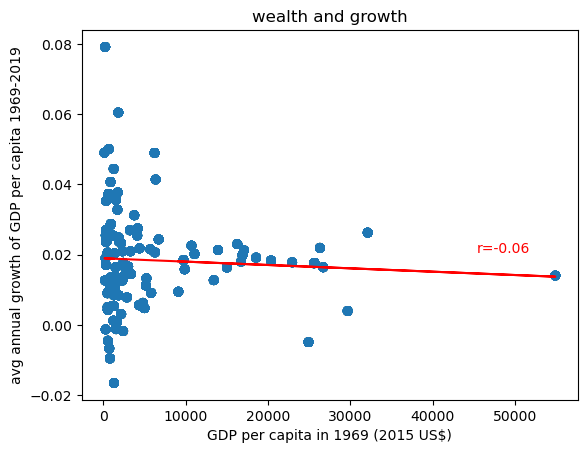

In [138]:
# plot without grouping

# fitting line
b, m = polyfit(dta2.gdp_pc1969, dta2.avg_gdpc_growth, 1)

# calculate correlation
r, p = sp.stats.pearsonr(x=dta2.gdp_pc1969, y=dta2.avg_gdpc_growth)

# plot
plt.scatter(dta2.gdp_pc1969, dta2.avg_gdpc_growth, linestyle='')
plt.plot(dta2.gdp_pc1969, b + m * dta2.gdp_pc1969, '-', color='red')
plt.xlabel('GDP per capita in 1969 (2015 US$)')
plt.ylabel('avg annual growth of GDP per capita 1969-2019') 
plt.title('wealth and growth')
# add the pearson correlation coefficient to the plot, truncate to 2 decimal places
plt.text(.8, .4, 'r={:.2f}'.format(r), transform=ax.transAxes, color='red')


plt.show()

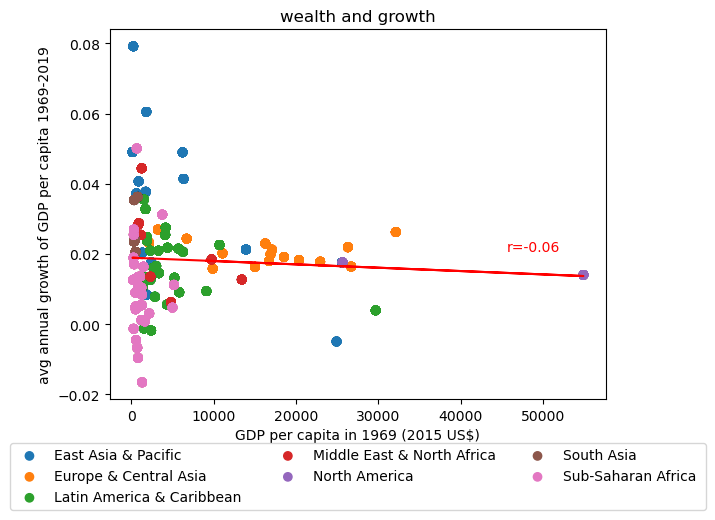

In [139]:
# plot by region
groups = dta2.groupby('region')

# Plot
fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.scatter(group.gdp_pc1969, group.avg_gdpc_growth, linestyle='', label=name)
ax.legend(ncol=3,loc='upper center', bbox_to_anchor=(0.5, -0.1),
         fancybox=True, shadow=False)
plt.plot(dta2.gdp_pc1969, b + m * dta2.gdp_pc1969, '-', color='red')
plt.xlabel('GDP per capita in 1969 (2015 US$)')
plt.ylabel('avg annual growth of GDP per capita 1969-2019') 
plt.title('wealth and growth')
# add the pearson correlation coefficient to the plot, truncate to 2 decimal places
plt.text(.8, .4, 'r={:.2f}'.format(r), transform=ax.transAxes, color='red')
plt.show()

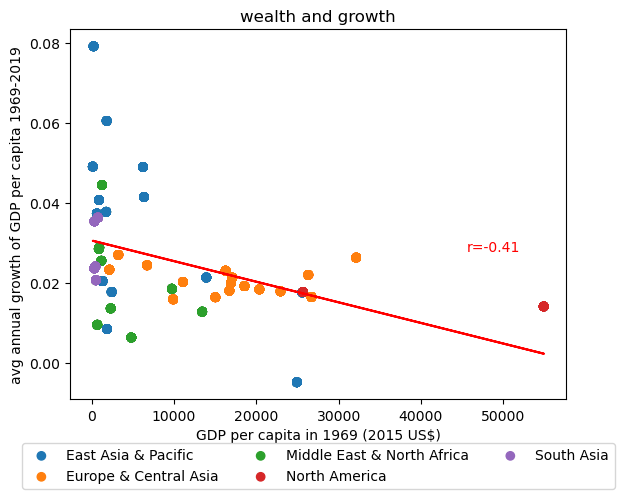

In [140]:
# exclude regions
tmp=dta2[((dta2.region != 'Latin America & Caribbean ')&
                     (dta2.region != 'Sub-Saharan Africa '))]
b, m = polyfit(tmp.gdp_pc1969, tmp.avg_gdpc_growth, 1)
# calculate correlation
r, p = sp.stats.pearsonr(x=tmp.gdp_pc1969, y=tmp.avg_gdpc_growth)

# group by regions
groups = tmp.groupby('region')

# Plot
fig, ax = plt.subplots()
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling
for name, group in groups:
    ax.scatter(group.gdp_pc1969, group.avg_gdpc_growth, linestyle='', label=name)
ax.legend(ncol=3,loc='upper center', bbox_to_anchor=(0.5, -0.1),
         fancybox=True, shadow=False)
plt.plot(tmp.gdp_pc1969, b + m * tmp.gdp_pc1969, '-', color='red')
plt.text(.8, .4, 'r={:.2f}'.format(r), transform=ax.transAxes, color='red')
plt.xlabel('GDP per capita in 1969 (2015 US$)')
plt.ylabel('avg annual growth of GDP per capita 1969-2019') 
plt.title('wealth and growth')
plt.show()